<a href="https://colab.research.google.com/github/RahulManavalan/FENICS-/blob/master/Assignment_1_Week_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install matplotlib==3.0.3
from google.colab import files
try:
    from dolfin import *; from mshr import *
except ImportError as e:
    !apt-get install -y -qq software-properties-common python-software-properties module-init-tools
    !add-apt-repository -y ppa:fenics-packages/fenics
    !apt-get update -qq
    !sed -e 's:artful:bionic:' /etc/apt/sources.list.d/fenics-packages-ubuntu-fenics-artful.list > temp
    !mv temp /etc/apt/sources.list.d/fenics-packages-ubuntu-fenics-artful.list
    !sed -e 's:artful:bionic:' /etc/apt/sources.list > temp
    !mv temp /etc/apt/sources.list
    !apt-get update -qq
    !apt install -y --no-install-recommends fenics    
    from dolfin import *; from mshr import *

import matplotlib.pyplot as plt 
import numpy as np 
import time 
import logging 
from IPython.display import update_display,clear_output,display 
import dolfin.common.plotting as fenicsplot 
logging.getLogger('FFC').setLevel(logging.WARNING) 
set_log_active(False)

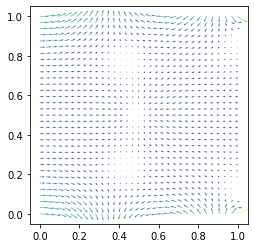

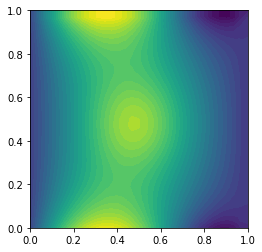

In [8]:
from dolfin import * 
import matplotlib.pyplot as plt

mesh = UnitSquareMesh(32,32) 
BDM = FiniteElement("BDM",mesh.ufl_cell(),1) 
DG = FiniteElement("DG",mesh.ufl_cell(),0) 
W = FunctionSpace(mesh,BDM*DG) 

(sigma,u) = TrialFunctions(W) 
(tau,v) = TestFunctions(W) 
f  = Expression("10*exp(-(pow(x[0] - 0.5, 2) + pow(x[1] - 0.5, 2)) / 0.02)", degree=2)
a = (dot(sigma,tau)+div(tau)*u+div(sigma)*v)*dx
L = - f*v*dx


class BoundarySource(UserExpression): 
  def __init__ (self,mesh,**kwargs):
    self.mesh = mesh 
    super().__init__(**kwargs)
  def eval_cell(self,values,x,ufc_cell):
    cell = Cell(self.mesh,ufc_cell.index) 
    n = cell.normal(ufc_cell.local_facet) 
    g = sin(5*x[0]) 
    values[0] = g*n[0] 
    values[1] = g*n[1] 
  def value_shape(self):
    return (2,) 
  
G = BoundarySource(mesh,degree=2) 

def boundary(x):
  return x[1] < DOLFIN_EPS or x[1]>1.0-DOLFIN_EPS 

bc = DirichletBC(W.sub(0),G,boundary) 

w  = Function(W) 
solve(a==L,w,bc) 
(sigma,u) = w.split() 

plt.figure() 
plot(sigma) 

plt.figure() 
plot(u) 

plt.show() 

In [43]:
"""def plot_compact(u, t, stepcounter): # Compact plot utility function
  if stepcounter % 5 == 0:
    #u.set_allow_extrapolation(True)
    uEuclidnorm = project(u,Q)
    ax.cla()
    fig = plt.gcf()
    fig.set_size_inches(16, 4)
    ax1 = plt.subplot(1, 2, 1)
    fenicsplot.mplot_function(ax1,uEuclidnorm) 
    plt.title("Wave") # Plot norm of solution

    #plt.colorbar(pp, shrink=0.5)
    plt.subplot(1, 2, 2);
    plt.triplot(fenicsplot.mesh2triang(mesh))
    plt.title("Mesh") 
    plt.suptitle('Wave - t: %f' %(t))
    plt.tight_layout(); 
    clear_output(wait=True) 
    dpl = display(pl);
  
  return (pl, ax)"""

In [48]:
def plot_compact(u, t, stepcounter, QQ, pl, ax, soltit = "Velocity"): # Compact plot utility function
  if stepcounter == 0:
    pl, ax = plt.subplots(); display(pl); clear_output(); # Plotting setup
  if stepcounter % 5 == 0:
    #u.set_allow_extrapolation(True)
    uEuclidnorm = project(sqrt(inner(u, u)), QQ)
    ax.cla()
    fig = plt.gcf()
    fig.set_size_inches(20, 20)
    plt.subplot(1, 2, 1)
    pp = plot(uEuclidnorm, cmap="coolwarm")
    plt.title("%s at t=%f" % (soltit, t)) # Plot norm of solution
    if t == 0:
      plt.axis(G)
      plt.colorbar(pp, shrink=0.5)
    plt.subplot(1, 2, 2);
    if t == 0:
      plot(QQ.mesh())
      plt.title("Mesh") # Plot mesh
    plt.tight_layout(); dpl = display(pl, display_id="test");
  
  return (pl, ax)

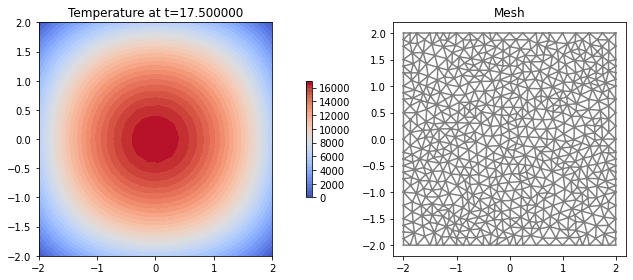

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  app.launch_new_instance()


Relative error = 0.028271236280296812


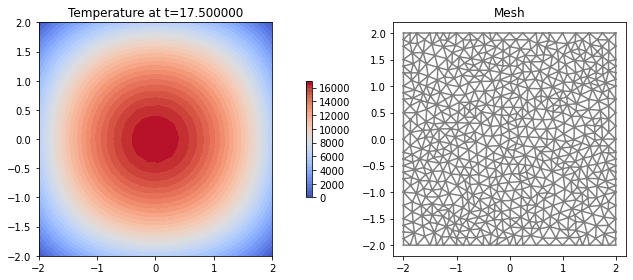

In [42]:
xmin , xmax = -2. , 2. 
ymin , ymax = -2. , 2. 
G = [xmin , xmax ,ymin , ymax] 
mresolution = 20 
mesh = generate_mesh(Rectangle(Point(G[0],G[2]),Point(G[1],G[3])),mresolution)
V = FunctionSpace(mesh,"CG",1) 
v = TestFunction(V)
u = Function(V) 

def boundary(x,on_boundary):
  return on_boundary

theta = 1.0 
t = 0 
T = 20.0 
k = 0.5 
k_coeff = 1.0
ue = Expression("exp(-(x[0]*x[0] + x[1]*x[1])/(a*4*t))/(4*pi*a*t)",a=k_coeff,t=1e-7,domain=mesh,degree=1) 
u0 = ue 

bc = DirichletBC(V,ue,boundary) 

pl,ax = None , None 
stepcounter = 0 
timer0 = time.clock() 

while t<T:
  um = theta*u + (1.0 - theta)*u0 
  r = (u-u0)/k*v*dx + k_coeff*inner(grad(um),grad(v))*dx 

  solve(r==0,u,bc) 
  pl,ax = plot_compact(u,t,stepcounter,V,pl,ax,soltit="Temperature") 
  t = t + k 
  u0 = project(u,V)
  ue.t = t  
  stepcounter += 1 

e1 = assemble((ue-u0)*(ue-u0)*dx)
e2 = assemble(ue*ue*dx) 
re = sqrt(e1/e2) 
print("Relative error = {}".format(re))

In [52]:
# Define domain and mesh
XMIN, XMAX = -10., 10.;
YMIN, YMAX = -0.5, 0.5;
G = [XMIN, XMAX, YMIN, YMAX];
mresolution = 50;
mesh = generate_mesh(Rectangle(Point(G[0], G[2]), Point(G[1], G[3])), mresolution)

# Define function spaces and functions
degree=1
Ve = FiniteElement("CG", mesh.ufl_cell(), degree)
Q = FunctionSpace(mesh,Ve);
TH = MixedElement([Ve,Ve])
W = FunctionSpace(mesh, TH)
(p, q) = TestFunctions(W); 
w = Function(W); 
(u, v) = (w[0], w[1]);
u0 = Function(Q); 
v0 = Function(Q);

# Time interval and time step
t, T = 0., 5.;
k = 0.05;
a = 1;

# Define the Dirichlet boundary   
def boundary(x, on_boundary):                                                                                                                                                                                                 
    return on_boundary

# Initial solution
option = 0;
if option==0:
    ue = Expression("(1-pow(a*t-x[0],2))*exp(-pow(a*t-x[0],2)) + (1-pow(a*t+x[0],2))*exp(-pow(a*t+x[0],2))", a=a, t=0, domain=mesh, degree=degree+1);
    ve = Expression("2*a*(a*t-x[0])*(pow(a*t-x[0],2)-2)*exp(-pow(a*t-x[0],2)) + 2*a*(a*t+x[0])*(pow(a*t+x[0],2)-2)*exp(-pow(a*t+x[0],2))", a=a, t=0, domain=mesh, degree=degree+1)
if option==1:
    ue = Expression("(1-pow(a*t+x[0],2))*exp(-pow(a*t+x[0],2))", a=a, t=0, domain=mesh, degree=degree);
    ve = Expression("2*a*(a*t+x[0])*(pow(a*t+x[0],2)-2)*exp(-pow(a*t+x[0],2))", a=a, t=0, domain=mesh, degree=degree+1)

# Boundary conditions
bcu = DirichletBC(W.sub(0), ue, boundary)
bcv = DirichletBC(W.sub(1), ve, boundary)
bcs = [bcu, bcv];

# Initial solution
u0 = ue;
v0 = ve;

# Time scheme parameter
theta = 0.5;

# Inititalize time stepping
pl, ax = None, None; 
stepcounter = 0; 
timer0 = time.clock()

# Time-stepping loop    
while t < T:
    # Weak form of wave equation
    vm = theta*v + (1.0-theta)*v0;
    um = theta*u + (1.0-theta)*u0;
    ru=(u-u0)/k*p*dx - vm*p*dx
    rv=(v-v0)/k*q*dx + a*a*inner(grad(um),grad(q))*dx
    r = ru + rv;
    ue.t = t;
    ve.t = t;
    
    # Solve the wave equation (one time step)
    solve(r==0, w, bcs);
    
    # Shift to next timestep                                                     
    u0 = project(u, Q);
    v0 = project(v, Q);
    
    # Visualize the solution
    pl, ax=plot_compact(u0, t, stepcounter, Q, pl, ax)
    t += k;
    stepcounter += 1;

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  app.launch_new_instance()


In [54]:
e = u - ue;
e1 = sqrt(assemble(e*e*dx))
e2 = sqrt(assemble(ue*ue*dx))
re = e1/e2
print ("Relative L2_error = {}".format(re))

Relative L2_error = 0.06911259522982505


In [55]:
XMIN = 0.; 
XMAX = 4.; 
YMIN = 0; 
YMAX = 1.; 
G = [XMIN, XMAX, YMIN, YMAX]; 
eps = 1e-5

mresolution=30

SEGMENTS = 15;
circle = Circle(Point(.5, .5), .1, SEGMENTS)

mesh = generate_mesh(Rectangle(Point(G[0], G[2]), Point(G[1], G[3])) - circle, mresolution)
# FEM function spaces and functions
degree=1
Qe = FiniteElement("CG", mesh.ufl_cell(), degree)
Q = FunctionSpace(mesh,Qe);

Ve = VectorElement("CG", mesh.ufl_cell(), degree)
V = FunctionSpace(mesh,Ve);

TH = MixedElement([Ve,Qe])
W = FunctionSpace(mesh, TH)

h = 0.5*CellDiameter(mesh);
(v, q) = TestFunctions(W);
w = Function(W); 
(u, p) = (as_vector((w[0], w[1])), w[2]); 
u0 = Function(V)

# Inlet velocity
uin = Expression(("4*(x[1]*(YMAX-x[1]))/(YMAX*YMAX)", "0."), YMAX=YMAX, degree=degree+1) 
# Mark regions for boundary conditions
om = Expression("x[0] > XMAX - eps ? 1. : 0.", XMAX=XMAX, eps=eps, degree=degree) 
im = Expression("x[0] < XMIN + eps ? 1. : 0.", XMIN=XMIN, eps=eps, degree=degree)
nm = Expression("x[0] > XMIN + eps && x[0] < XMAX - eps ? 1. : 0.", XMIN=XMIN, XMAX=XMAX, eps=eps, degree=degree)

# Timestep, viscosity and stabilization parameters
k = 0.1; 
d = .2*h**(3./2.) 

# Time interval and penalty parameter
t, T = 0., 10.; 
gamma = 10*1./h 

pl, ax = None, None; 

# Initialize time stepping
stepcounter = 0; 
timer0 = time.clock()
pl, ax = None, None; 

# Time stepping method
theta = 0.5 # 0.5 - Midpoint rule, 1.0 - Implicit Euler, 0.0 - Explicit Euler
# Time-stepping loop
while t < T: 
    # Weak residual of stabilized FEM for Navier-Stokes eq.
    um = theta*u + (1.0-theta)*u0
    
    # Navier-Stokes equations in weak residual form
    r = ((inner((u - u0)/k + grad(p) + grad(um)*um, v) + div(um)*q)*dx +
        gamma*(om*p*q + im*inner(u - uin, v) + nm*inner(u, v))*ds + # Weak boundary conditions
        d*(inner(grad(p) + grad(um)*um, grad(q) + grad(um)*v) + inner(div(um), div(v)))*dx) # Stabilization
    
    # Solve the Navier-Stokes PDE (one timestep)
    solve(r==0, w)  

    # Visualize the solution
    pl, ax=plot_compact(u0, t, stepcounter, Q, pl, ax, soltit="Velocity") # Plot all quantities (see implementation above)
    
    # Shift to next timestep
    t += k; 
    stepcounter += 1; 
    u0 = project(u, V); 

print("elapsed CPU time: ", (time.clock() - timer0)) 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  app.launch_new_instance()


elapsed CPU time:  400.2779620000001


In [56]:
L2u_norm = sqrt(assemble(inner(u, u)*dx));
print ("L2 norm = {}".format(L2u_norm))

L2 norm = 1.5720150015018781
